##ECSE 415 - Assignment 2: Feature extraction

#Theo Ghanem 260972584

#1  Harris Corner Detection

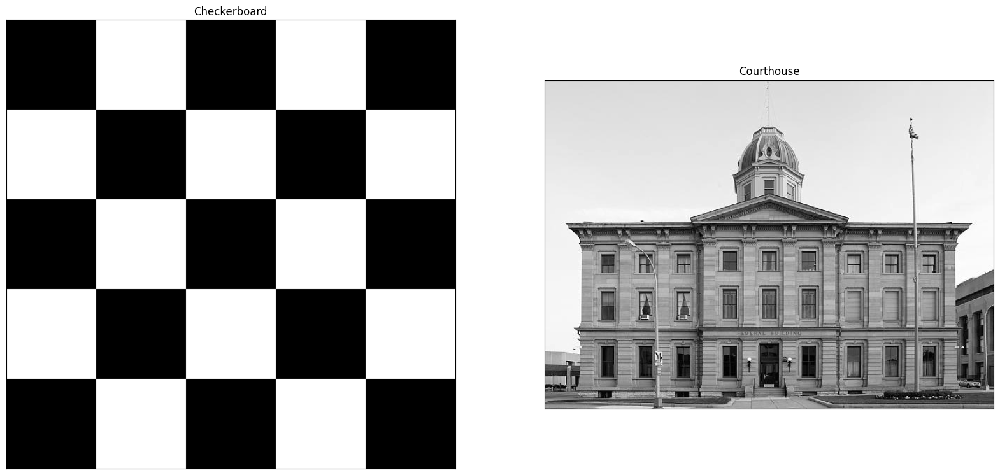

In [149]:
from matplotlib import pyplot as plt
import cv2
import numpy as np
# from google.colab import drive
# drive.mount('/content/drive')
# 
# path = '/content/drive/My Drive/ECSE415_computer_vision/A2/'
path = '/Users/theog/Documents/CodingProjects/ECSE415_Computer_Vision/Assignments/A2/A2-W24-images/Data/'

#Load the 2 images
checkerboard = cv2.imread(path+'Q1/checkerboard.png')
courthouse = cv2.imread(path+'Q1/courthouse_gray.jpg')

checkerboard = cv2.cvtColor(checkerboard, cv2.COLOR_BGR2GRAY)
courthouse = cv2.cvtColor(courthouse, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(checkerboard, cmap='gray') # 2x2 subplot, 1 selected
plt.title("Checkerboard"), plt.xticks([]), plt.yticks([]) # title and remove the axis tick
plt.subplot(122), plt.imshow(courthouse, cmap='gray') # 2x2 subplot, 2 selected
plt.title("Courthouse"), plt.xticks([]), plt.yticks([])
plt.show()

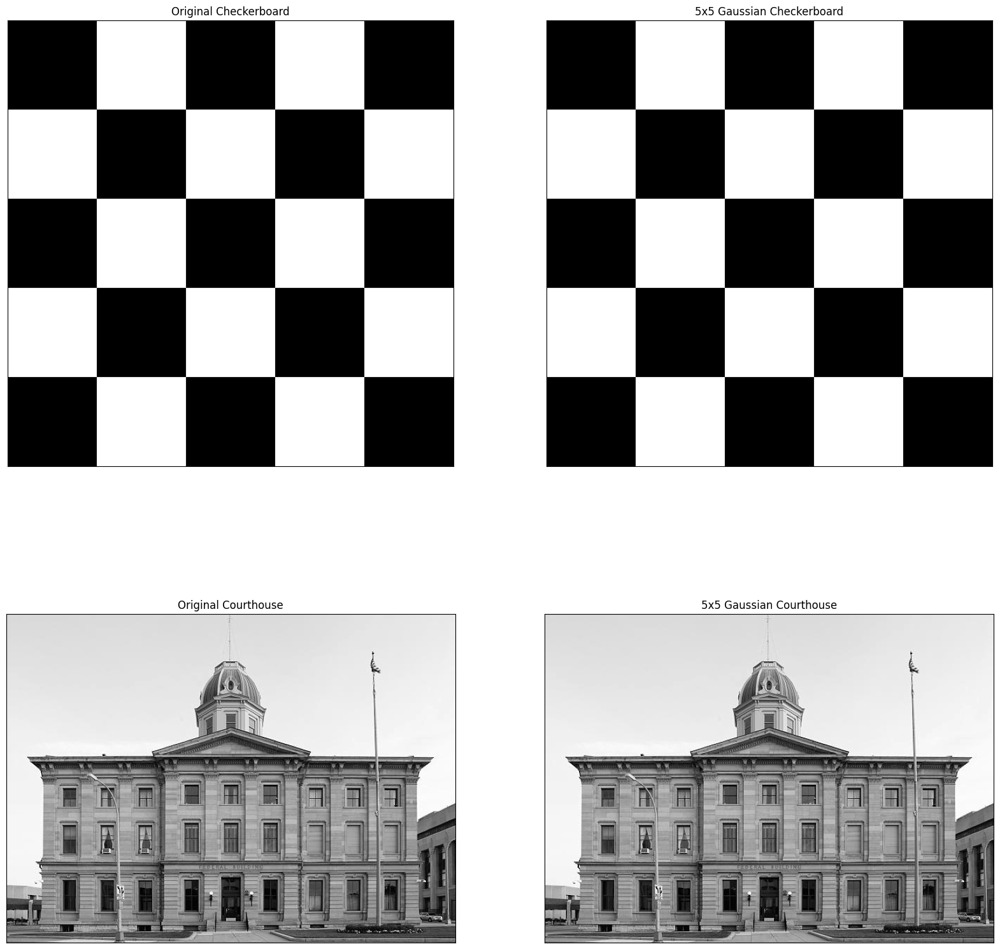

In [150]:
#Smoothing the images using Gaussian Blur as specified in Tutorial 2

# filter image using 5x5 Gaussian, the std is calculated automatically
# checkerboard_Gaussian_5 = cv2.GaussianBlur(checkerboard, (3,3), 0)
# courthouse_Gaussian_5 = cv2.GaussianBlur(courthouse, (3,3), 0)
checkerboard_Gaussian_5 = checkerboard
courthouse_Gaussian_5 = courthouse

# display images
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(checkerboard, cmap='gray')
plt.title("Original Checkerboard"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(checkerboard_Gaussian_5, cmap='gray')
plt.title("5x5 Gaussian Checkerboard"), plt.xticks([]), plt.yticks([])

plt.subplot(223), plt.imshow(courthouse, cmap='gray')
plt.title("Original Courthouse"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(courthouse_Gaussian_5, cmap='gray')
plt.title("5x5 Gaussian Courthouse"), plt.xticks([]), plt.yticks([])
plt.show()

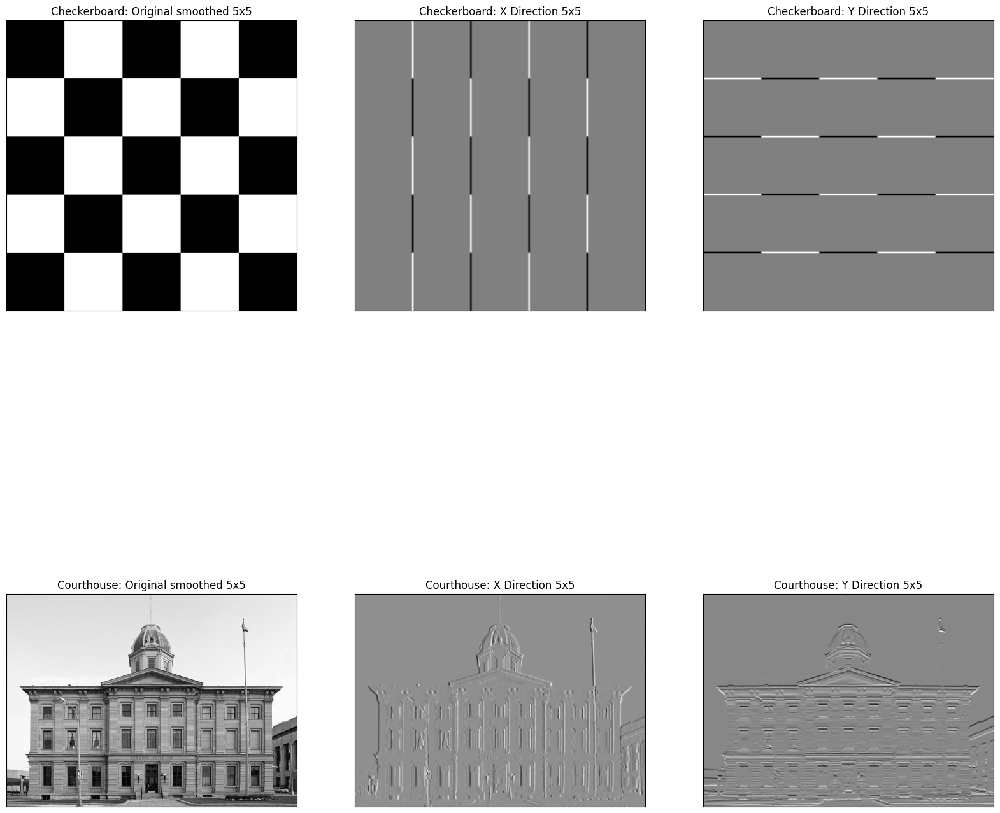

In [151]:
# Computer derivatives in x and y directions for smoothed 5x5 and 11x11, for both images
# apply 15x15 Sobel filters to the intensity channel
checkerboard_derivative_x_5 = cv2.Sobel(checkerboard_Gaussian_5, cv2.CV_64F, 1, 0, ksize=5)
checkerboard_derivative_y_5 = cv2.Sobel(checkerboard_Gaussian_5, cv2.CV_64F, 0, 1, ksize=5)

courthouse_derivative_x_5 = cv2.Sobel(courthouse_Gaussian_5, cv2.CV_64F, 1, 0, ksize=5)
courthouse_derivative_y_5 = cv2.Sobel(courthouse_Gaussian_5, cv2.CV_64F, 0, 1, ksize=5)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(231), plt.imshow(checkerboard_Gaussian_5, cmap="gray")
plt.title("Checkerboard: Original smoothed 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(checkerboard_derivative_x_5, cmap="gray")
plt.title("Checkerboard: X Direction 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(checkerboard_derivative_y_5, cmap="gray")
plt.title("Checkerboard: Y Direction 5x5"), plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(courthouse_Gaussian_5, cmap="gray")
plt.title("Courthouse: Original smoothed 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(courthouse_derivative_x_5, cmap="gray")
plt.title("Courthouse: X Direction 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(courthouse_derivative_y_5, cmap="gray")
plt.title("Courthouse: Y Direction 5x5"), plt.xticks([]), plt.yticks([])

plt.show()

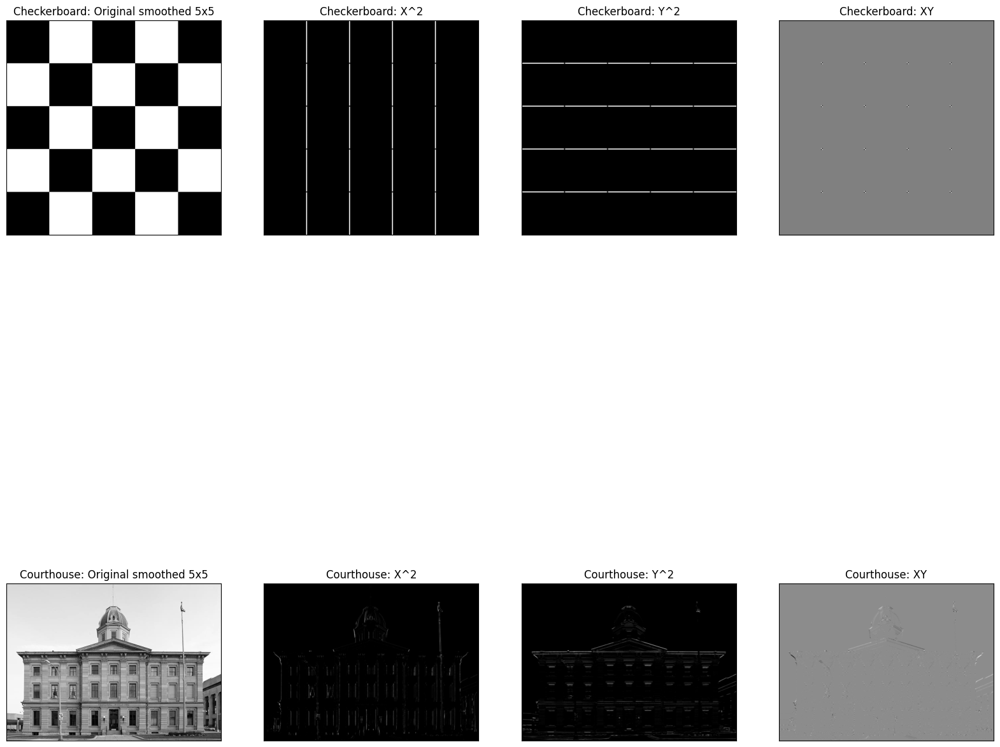

In [152]:
# compute square of derivatives
checkerboard_derivative_x2 = np.square(checkerboard_derivative_x_5)
checkerboard_derivative_y2 = np.square(checkerboard_derivative_y_5)
checkerboard_derivative_xy = checkerboard_derivative_x_5 * checkerboard_derivative_y_5

courthouse_derivative_x2 = np.square(courthouse_derivative_x_5)
courthouse_derivative_y2 = np.square(courthouse_derivative_y_5)
courthouse_derivative_xy = courthouse_derivative_x_5 * courthouse_derivative_y_5

# display images
plt.figure(figsize=(20, 20))
plt.subplot(241), plt.imshow(checkerboard_Gaussian_5, cmap="gray")
plt.title("Checkerboard: Original smoothed 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(242), plt.imshow(checkerboard_derivative_x2, cmap="gray")
plt.title("Checkerboard: X^2"), plt.xticks([]), plt.yticks([])
plt.subplot(243), plt.imshow(checkerboard_derivative_y2, cmap="gray")
plt.title("Checkerboard: Y^2"), plt.xticks([]), plt.yticks([])
plt.subplot(244), plt.imshow(checkerboard_derivative_xy, cmap="gray")
plt.title("Checkerboard: XY"), plt.xticks([]), plt.yticks([])

plt.subplot(245), plt.imshow(courthouse_Gaussian_5, cmap="gray")
plt.title("Courthouse: Original smoothed 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(246), plt.imshow(courthouse_derivative_x2, cmap="gray")
plt.title("Courthouse: X^2"), plt.xticks([]), plt.yticks([])
plt.subplot(247), plt.imshow(courthouse_derivative_y2, cmap="gray")
plt.title("Courthouse: Y^2"), plt.xticks([]), plt.yticks([])
plt.subplot(248), plt.imshow(courthouse_derivative_xy, cmap="gray")
plt.title("Courthouse: XY"), plt.xticks([]), plt.yticks([])

plt.show()

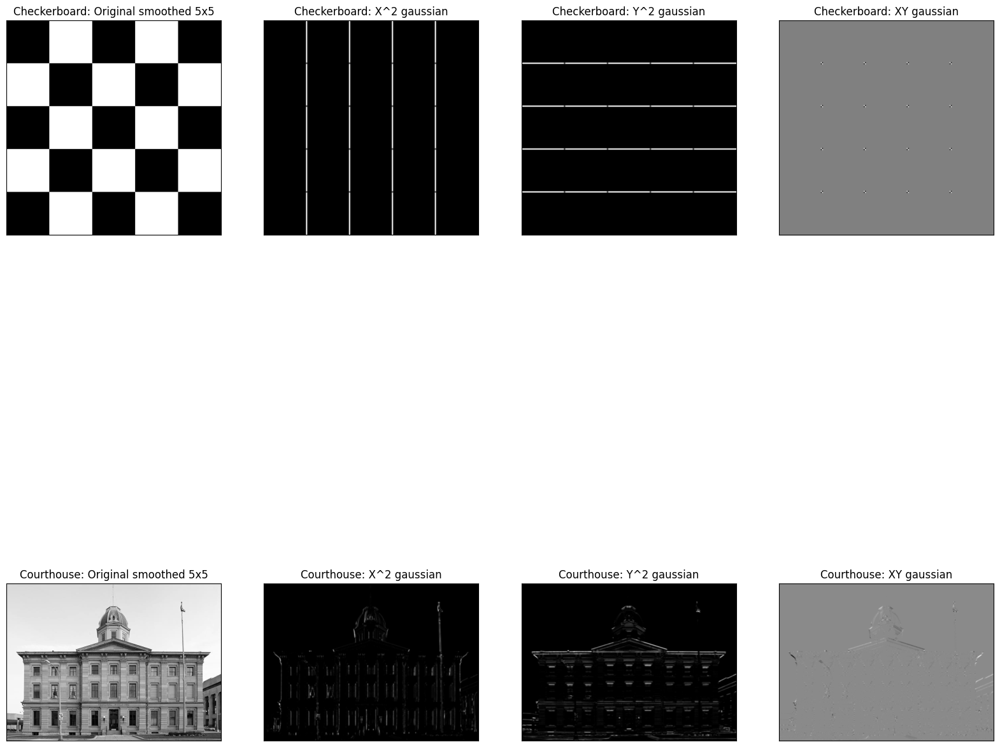

In [153]:
# apply gaussian filter
checkerboard_derivative_x2_gaussian = cv2.GaussianBlur(checkerboard_derivative_x2,(3, 3), 0)
checkerboard_derivative_y2_gaussian = cv2.GaussianBlur(checkerboard_derivative_y2,(3, 3), 0)
checkerboard_derivative_xy_gaussian = cv2.GaussianBlur(checkerboard_derivative_xy,(3, 3), 0)

courthouse_derivative_x2_gaussian = cv2.GaussianBlur(courthouse_derivative_x2,(3, 3), 0)
courthouse_derivative_y2_gaussian = cv2.GaussianBlur(courthouse_derivative_y2,(3, 3), 0)
courthouse_derivative_xy_gaussian = cv2.GaussianBlur(courthouse_derivative_xy,(3, 3), 0)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(241), plt.imshow(checkerboard_Gaussian_5, cmap="gray")
plt.title("Checkerboard: Original smoothed 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(242), plt.imshow(checkerboard_derivative_x2_gaussian, cmap="gray")
plt.title("Checkerboard: X^2 gaussian"), plt.xticks([]), plt.yticks([])
plt.subplot(243), plt.imshow(checkerboard_derivative_y2_gaussian, cmap="gray")
plt.title("Checkerboard: Y^2 gaussian"), plt.xticks([]), plt.yticks([])
plt.subplot(244), plt.imshow(checkerboard_derivative_xy_gaussian, cmap="gray")
plt.title("Checkerboard: XY gaussian"), plt.xticks([]), plt.yticks([])

plt.subplot(245), plt.imshow(courthouse_Gaussian_5, cmap="gray")
plt.title("Courthouse: Original smoothed 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(246), plt.imshow(courthouse_derivative_x2_gaussian, cmap="gray")
plt.title("Courthouse: X^2 gaussian"), plt.xticks([]), plt.yticks([])
plt.subplot(247), plt.imshow(courthouse_derivative_y2_gaussian, cmap="gray")
plt.title("Courthouse: Y^2 gaussian"), plt.xticks([]), plt.yticks([])
plt.subplot(248), plt.imshow(courthouse_derivative_xy_gaussian, cmap="gray")
plt.title("Courthouse: XY gaussian"), plt.xticks([]), plt.yticks([])

plt.show()

Computing the cornerness function response:
Determinant(H)−kT race(H)2), where k=0.05
Hessian matrix H is defined as: =[dx^2   dxdy]
                                 [dxdy   dy^2]
And the determinant of H is: det(H) = (dx^2 * dy^2) - (dxdy)^2
And the trace of H is: trace(H) = dx^2 + dy^2

length3


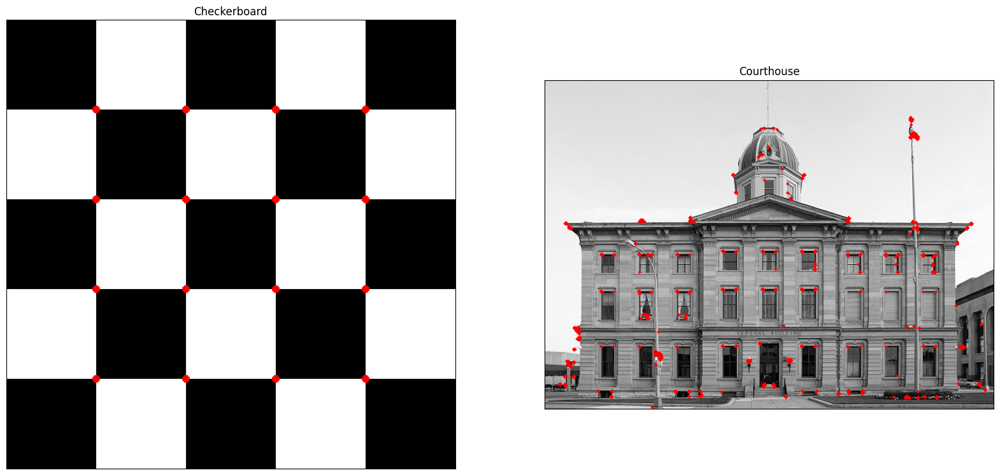

In [156]:
#based on information from tutorial 4
k=0.05
checkerboard_response = checkerboard_derivative_x2_gaussian * checkerboard_derivative_y2_gaussian - np.square(checkerboard_derivative_xy_gaussian) - k * np.square(checkerboard_derivative_x2_gaussian + checkerboard_derivative_y2_gaussian)
courthouse_response = courthouse_derivative_x2_gaussian * courthouse_derivative_y2_gaussian - np.square(courthouse_derivative_xy_gaussian) - k * np.square(courthouse_derivative_x2_gaussian + courthouse_derivative_y2_gaussian)

# convert to back to RGB for displaying
checkerboard = cv2.cvtColor(checkerboard, cv2.COLOR_BGR2RGB)
courthouse = cv2.cvtColor(courthouse, cv2.COLOR_BGR2RGB)

# normalize to make the response values between 0 and 1
cv2.normalize(checkerboard_response, checkerboard_response, 0, 2, cv2.NORM_MINMAX)
cv2.normalize(courthouse_response, courthouse_response, 0, 1, cv2.NORM_MINMAX)


# threshold for an optimal value
threshold_checkerboard = 1
threshold_courthouse = 0.4

# list all points higher than threshold in the response map
loc1 = np.where(checkerboard_response >= threshold_checkerboard)
loc2 = np.where(courthouse_response >= threshold_courthouse)

# loop though points and draw red circles on checkerboard image
for pt in zip(*loc1[::-1]):
  cv2.circle(checkerboard, pt, 2, (255,0,0), -1)

# loop though points and draw red circles on courthouse image
for pt in zip(*loc2[::-1]):
  # draw filled circle on each point
  # cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]]) → None
  cv2.circle(courthouse, pt, 2, (255,0,0), -1)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(checkerboard)
plt.title('Checkerboard'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(courthouse)
plt.title('Courthouse'), plt.xticks([]), plt.yticks([])
plt.show()

# 2 SIFT Features

##2.1 Sift in a nutshell

The four main actions of the SIFT algorithm:
1. **Identifying Maxima/Minima in Scale Space:**
The algorithm initially locates points in the image where the difference of Gaussian function exhibits maximum or minimum values across different scales. This step aims to identify key regions with significant variations in intensity, which are potential keypoints.

2. **Subpixel Interpolation for Enhanced Accuracy:**
Following the initial identification of keypoints, the algorithm refines their locations with subpixel accuracy through interpolation. This enhances the precision of keypoint localization, contributing to improved repeatability in subsequent matching processes.

3. **Thresholding and Edge Elimination:**
The algorithm eliminates keypoints with values below a specified Difference of Gaussian threshold. Then, it distinguishes between genuine corners and potential edges, discarding locations that appear more indicative of edges rather than distinctive corners. This step helps in selecting robust keypoints for further analysis.

4. **Orientation Computation:**
For each keypoint, the algorithm calculates the gradient magnitude and orientation of the image in the vicinity of the keypoint location. Subsequently, it identifies the most prominent orientation, aiding in the establishment of a consistent reference frame for each keypoint. This orientation information proves valuable for achieving rotational invariance in subsequent matching stages.









##2.2 SIFT between two different pictures

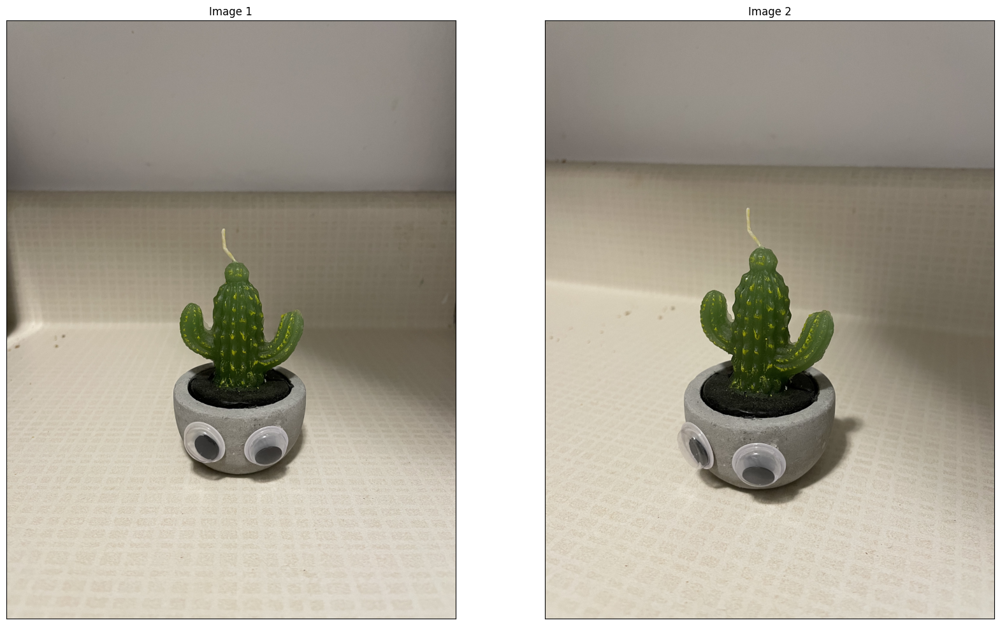

In [65]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

# from google.colab import drive
# drive.mount('/content/drive')
# 
# path = '/content/drive/My Drive/ECSE415_computer_vision/A2/'
path = '/Users/theog/Documents/CodingProjects/ECSE415_Computer_Vision/Assignments/A2/A2-W24-images/Data/'

#Load the 2 images
image_1 = cv2.imread(path+'Q2/Image1.png')
image_2 = cv2.imread(path+'Q2/Image2.png')
# 
# image_1 = cv2.resize(image_1, None, fx = 0.75, fy = 0.75)
# image_2 = cv2.resize(image_2, None, fx = 0.75, fy = 0.75)


image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

#Display images
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image_1) # 2x2 subplot, 1 selected
plt.title("Image 1"), plt.xticks([]), plt.yticks([]) # title and remove the axis ticks
plt.subplot(122), plt.imshow(image_2) # 2x2 subplot, 2 selected
plt.title("Image 2"), plt.xticks([]), plt.yticks([])
plt.show()


### 1. Compute SIFT keypoints for image_1 and image_2.

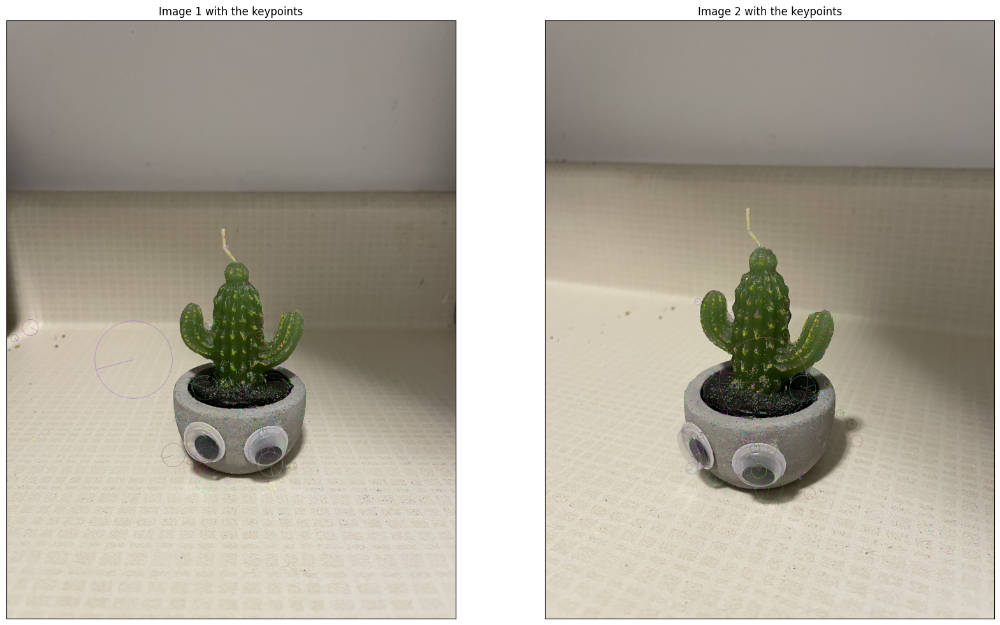

In [66]:

# compute SIFT keypoints for both images (from tutorial 4)
sift_obj = cv2.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(image_1, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(image_2, None)

# display keypoints
image_1 = cv2.drawKeypoints(image_1, keypoints_l, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image_2 = cv2.drawKeypoints(image_2, keypoints_r, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Display images
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(image_1) # 2x2 subplot, 1 selected
plt.title("Image 1 with the keypoints"), plt.xticks([]), plt.yticks([]) # title and remove the axis ticks
plt.subplot(122), plt.imshow(image_2) # 2x2 subplot, 2 selected
plt.title("Image 2 with the keypoints"), plt.xticks([]), plt.yticks([])
plt.show()


### 2. Match all keypoints between two images using a brute-force method.

In [67]:
# create a BFMatcher object which will match up the SIFT features
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors_l,descriptors_r)

### 3. Sort the matching keypoints according to the matching distance.

In [68]:
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
image_3 = cv2.drawMatches(image_1,keypoints_l,image_2,keypoints_r, matches[:10], None, flags=2)

### 4. Display the top ten matched keypoints.

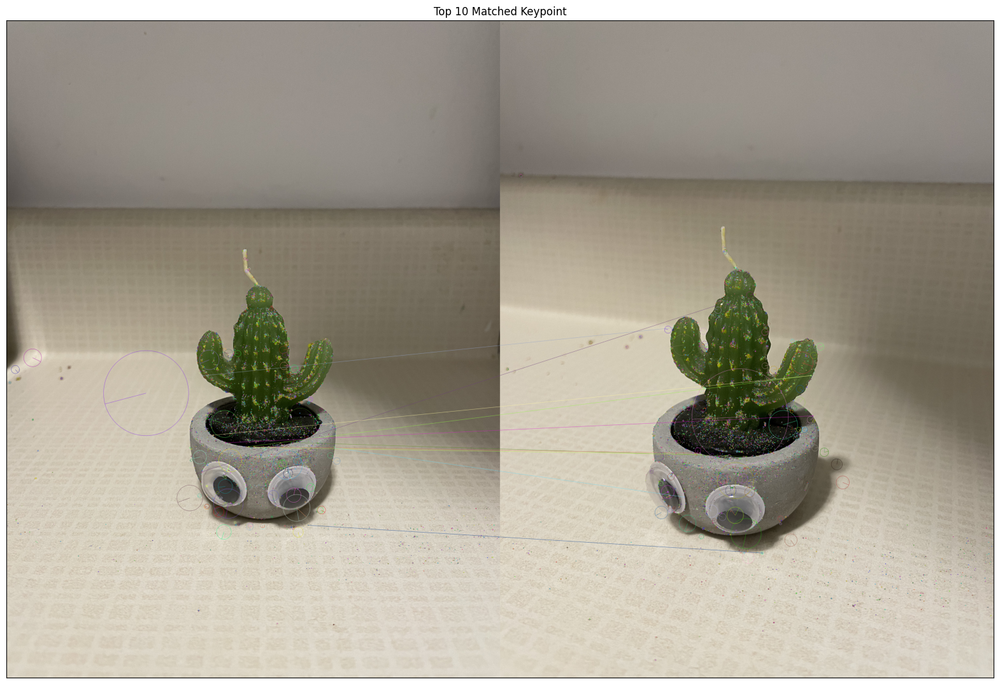

In [69]:
plt.figure(figsize=(20, 20))
plt.imshow(image_3)
plt.title('Top 10 Matched Keypoint'), plt.xticks([]), plt.yticks([])
plt.show()

### 5. Plot the matching distance for the top 100 matched keypoints. Plot the indices of keypoints on the x-axis and the corresponding matching distance on the y-axis.

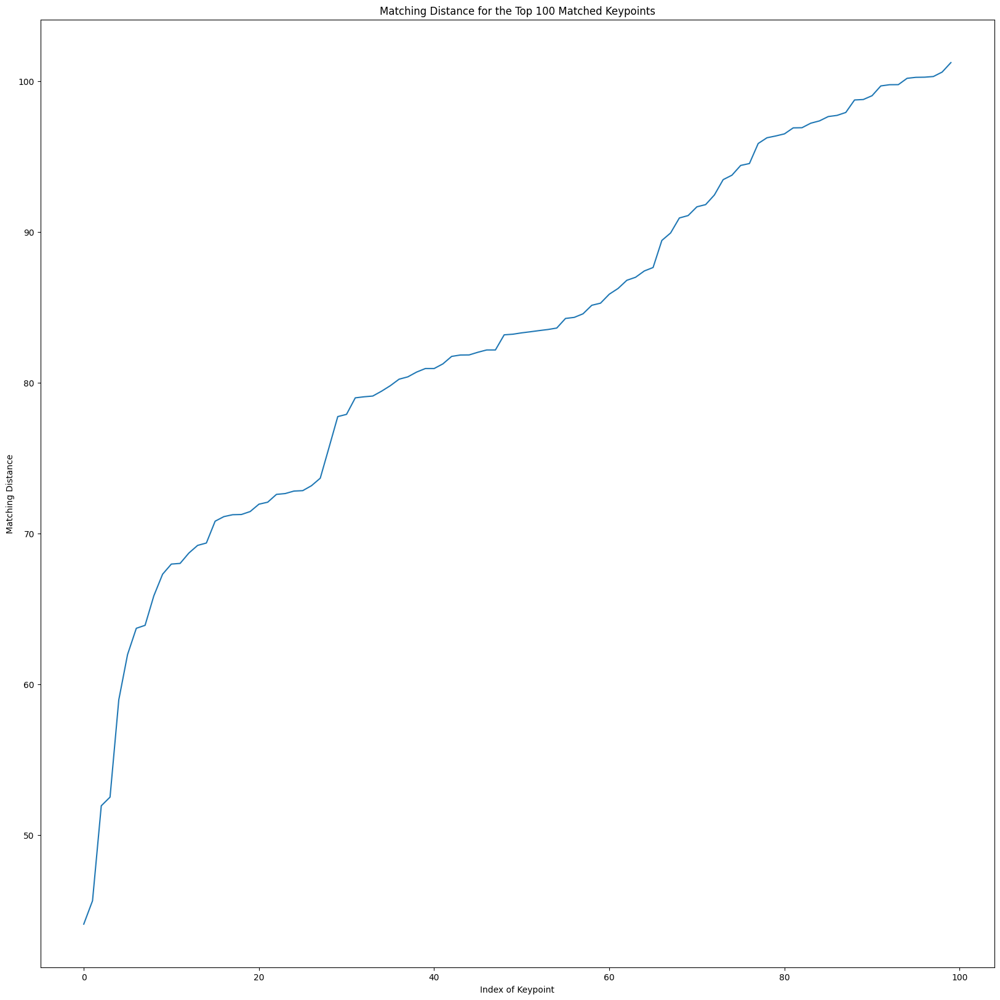

In [70]:
distances = [match.distance for match in matches[:100]]

plt.figure(figsize=(20, 20))
plt.plot(range(100), distances)
plt.title('Matching Distance for the Top 100 Matched Keypoints')
plt.xlabel('Index of Keypoint')
plt.ylabel('Matching Distance')
plt.show()

##2.3  Invariance Under Scale

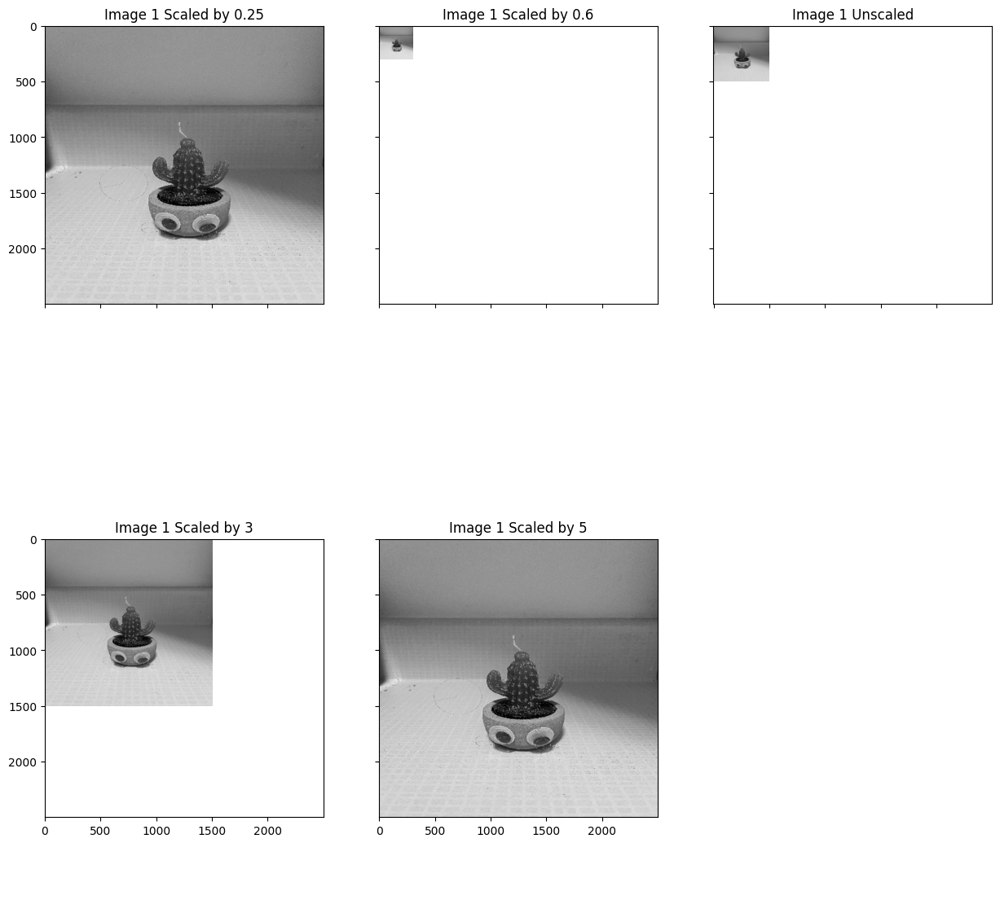

In [71]:
image_1=cv2.resize(image_1, (500,500))
image_2=cv2.resize(image_2, (500,500))

image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

# compute SIFT keypoints for image 1 (from tutorial 4)
sift_obj = cv2.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(image_1, None)

# scale image 1 by a factor of (0.25, 0.6, 3, 5)
image_1_25 = cv2.resize(image_1, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_CUBIC)
image_1_6 = cv2.resize(image_1, None, fx=0.6, fy=0.6, interpolation=cv2.INTER_CUBIC)
image_1_3 = cv2.resize(image_1, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
image_1_5 = cv2.resize(image_1, None, fx=5, fy=5, interpolation=cv2.INTER_CUBIC)

#display scaled images on the same x and y axis:
fig, axs = plt.subplots(2, 3, figsize=(15, 15), sharex=True, sharey=True)
axs[0, 0].imshow(image_1_5, cmap='gray')
axs[0, 0].set_title('Image 1 Scaled by 0.25')
axs[0, 1].imshow(image_1_6, cmap='gray')
axs[0, 1].set_title('Image 1 Scaled by 0.6')
axs[0, 2].imshow(image_1, cmap='gray')
axs[0, 2].set_title('Image 1 Unscaled')
axs[1, 0].imshow(image_1_3, cmap='gray')
axs[1, 0].set_title('Image 1 Scaled by 3')
axs[1, 1].imshow(image_1_5, cmap='gray')
axs[1, 1].set_title('Image 1 Scaled by 5')
axs[1, 2].axis('off')
plt.show()

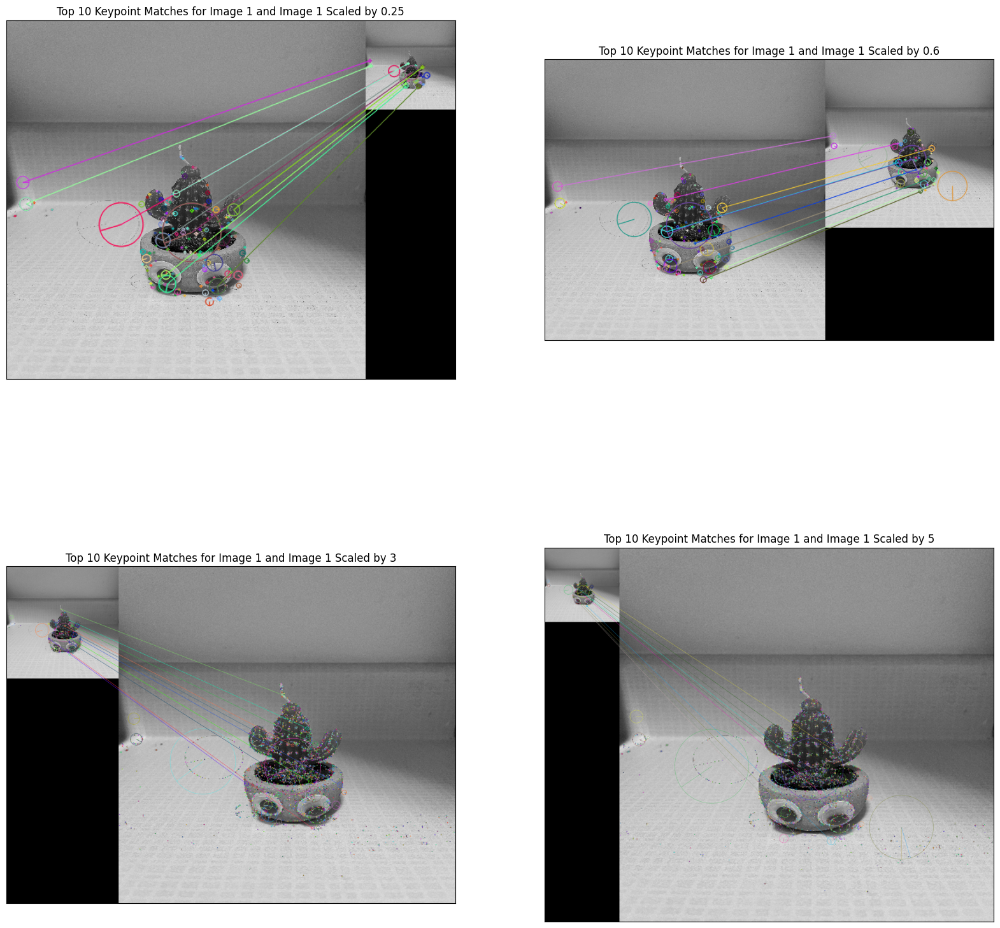

In [72]:

# next we compute SIFT keypoints for scaled images
keypoints_25, descriptors_25 = sift_obj.detectAndCompute(image_1_25, None)
keypoints_6, descriptors_6 = sift_obj.detectAndCompute(image_1_6, None)
keypoints_3, descriptors_3 = sift_obj.detectAndCompute(image_1_3, None)
keypoints_5, descriptors_5 = sift_obj.detectAndCompute(image_1_5, None)

# Using a brute force matcher we match all keypoints between image 1 and scaled images 
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches_25 = bf.match(descriptors_l,descriptors_25)
matches_6 = bf.match(descriptors_l,descriptors_6)
matches_3 = bf.match(descriptors_l,descriptors_3)
matches_5 = bf.match(descriptors_l,descriptors_5)

# Sort them in the order of their distance.
matches_25 = sorted(matches_25, key = lambda x:x.distance)
matches_6 = sorted(matches_6, key = lambda x:x.distance)
matches_3 = sorted(matches_3, key = lambda x:x.distance)
matches_5 = sorted(matches_5, key = lambda x:x.distance)

# Draw first 10 matches.
image_1_25 = cv2.drawMatches(image_1,keypoints_l,image_1_25,keypoints_25,matches_25[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_6 = cv2.drawMatches(image_1,keypoints_l,image_1_6,keypoints_6,matches_6[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_3 = cv2.drawMatches(image_1,keypoints_l,image_1_3,keypoints_3,matches_3[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_5 = cv2.drawMatches(image_1,keypoints_l,image_1_5,keypoints_5,matches_5[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

#Display images
plt.figure(figsize=(20, 20))
plt.subplot(221), plt.imshow(image_1_25)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 0.25'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(image_1_6)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 0.6'), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(image_1_3)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 3'), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(image_1_5)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Scaled by 5'), plt.xticks([]), plt.yticks([])
plt.show()


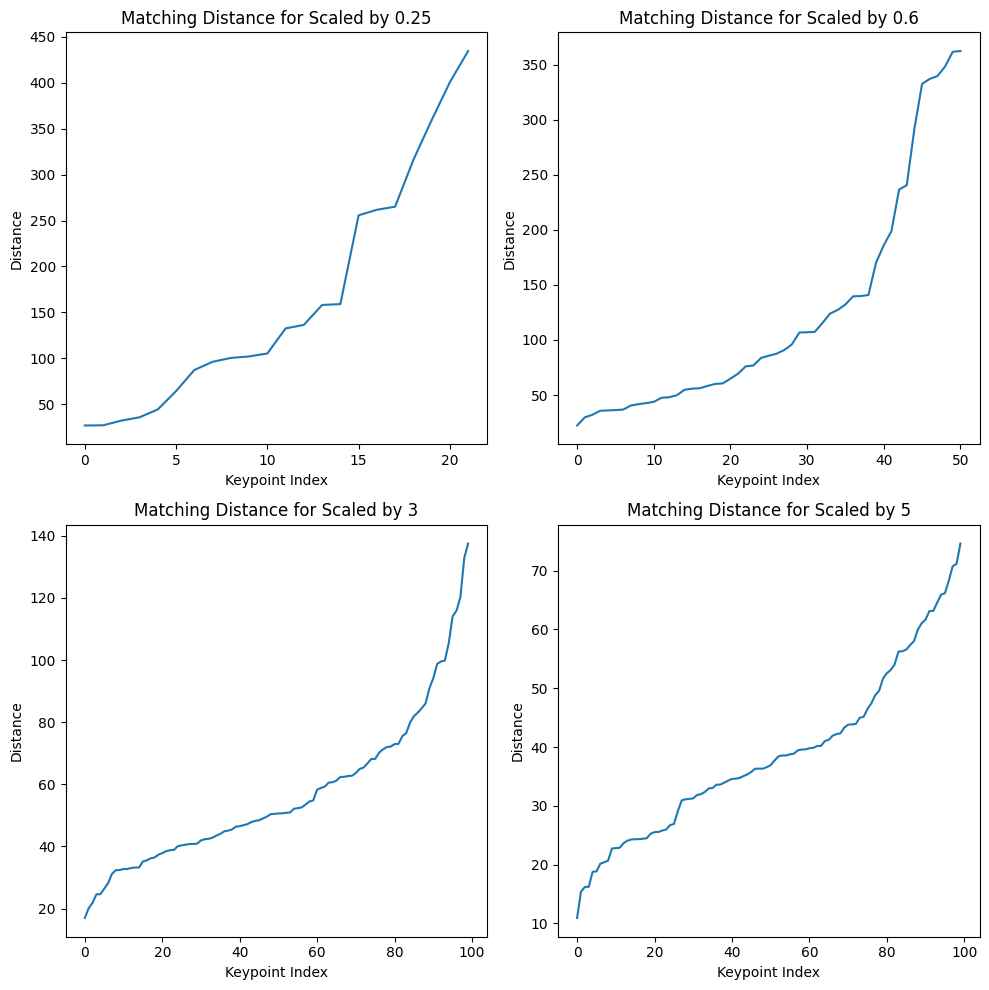

In [85]:
# create a list of tuples containing the scale factors and the corresponding matches
scale_factors_and_matches = [
  (0.25, [match.distance for match in matches_25[:100]]),
  (0.6, [match.distance for match in matches_6[:100]]),
  (3, [match.distance for match in matches_3[:100]]),
  (5, [match.distance for match in matches_5[:100]])
]

plt.figure(figsize=(10, 10))

# iterate over the list to create the subplots
for i, (scale_factor, distances) in enumerate(scale_factors_and_matches, start=1):
  plt.subplot(220 + i)
  plt.plot(range(len(distances)), distances)
  plt.title(f'Matching Distance for Scaled by {scale_factor}')
  plt.xlabel('Keypoint Index')
  plt.ylabel('Distance')

plt.tight_layout()
plt.show()

### 8. Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Explain. 

From the four plots above we notice a very minor change in matched distance as the scale increases, which is expected since the SIFT algorithm is not impacted by scale since it uses the gradient of the image to find keypoints and their descriptors. The gradient is not affected by scale, so the matching distance remains constant. Hence even with larger scales, many keypoints are correctly matched, while decreasing the distance.

##2.4  Invariance Under Rotation

### 1. Rotate image_1 at the angle of (30, 75, 90, 180). Display rotated images.

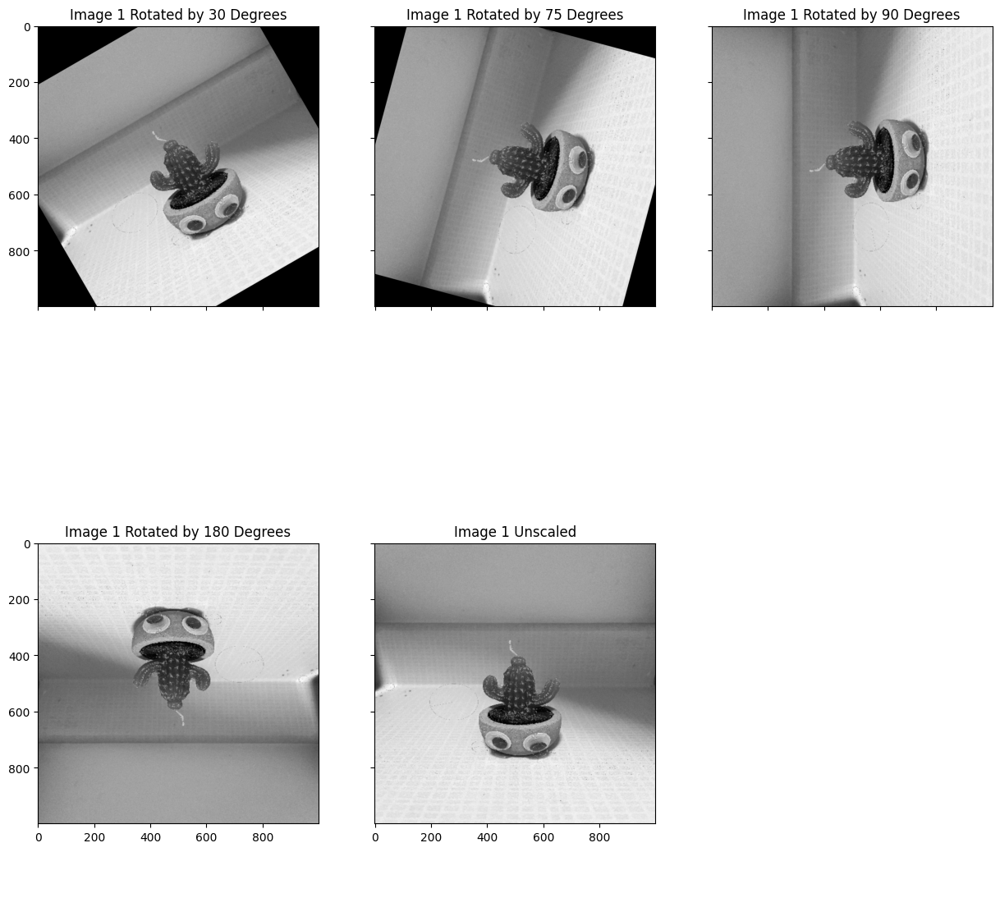

In [79]:
#Rotate image_1 at the angle of (30, 75, 90, 180). Display rotated images
#using cv2.getRotationMatrix2D() and cv2.warpAffine() functions
image_1_rotated_30_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 30, 1), (image_1.shape[1], image_1.shape[0]))
image_1_rotated_75_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 75, 1), (image_1.shape[1], image_1.shape[0]))
image_1_rotated_90_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 90, 1), (image_1.shape[1], image_1.shape[0]))
image_1_rotated_180_degrees = cv2.warpAffine(image_1, cv2.getRotationMatrix2D((image_1.shape[1]/2, image_1.shape[0]/2), 180, 1), (image_1.shape[1], image_1.shape[0]))

#display rotated images on the same x and y axis:
fig, axs = plt.subplots(2, 3, figsize=(15, 15), sharex=True, sharey=True)
axs[0, 0].imshow(image_1_rotated_30_degrees, cmap='gray')
axs[0, 0].set_title('Image 1 Rotated by 30 Degrees')
axs[0, 1].imshow(image_1_rotated_75_degrees, cmap='gray')
axs[0, 1].set_title('Image 1 Rotated by 75 Degrees')
axs[0, 2].imshow(image_1_rotated_90_degrees, cmap='gray')
axs[0, 2].set_title('Image 1 Rotated by 90 Degrees')
axs[1, 0].imshow(image_1_rotated_180_degrees, cmap='gray')
axs[1, 0].set_title('Image 1 Rotated by 180 Degrees')
axs[1, 1].imshow(image_1, cmap='gray')
axs[1, 1].set_title('Image 1 Unscaled')
axs[1, 2].axis('off')
plt.show()

### 2. Compute SIFT keypoints for all (total 4) transformed images.

In [80]:
# compute SIFT keypoints for rotated images
keypoints_30, descriptors_30 = sift_obj.detectAndCompute(image_1_rotated_30_degrees, None)
keypoints_75, descriptors_75 = sift_obj.detectAndCompute(image_1_rotated_75_degrees, None)
keypoints_90, descriptors_90 = sift_obj.detectAndCompute(image_1_rotated_90_degrees, None)
keypoints_180, descriptors_180 = sift_obj.detectAndCompute(image_1_rotated_180_degrees, None)

### 3. Match all keypoints of image_1 to the transformed images using a brute-force method.

In [81]:
 ##Match all keypoints of image_1 to the transformed images using a brute-force method.
matches_30 = bf.match(descriptors_l,descriptors_30)
matches_75 = bf.match(descriptors_l,descriptors_75)
matches_90 = bf.match(descriptors_l,descriptors_90)
matches_180 = bf.match(descriptors_l,descriptors_180)



### 4. Sort the matching keypoints according to the matching distance.

In [82]:
# Sort them in the order of their distance.
matches_30 = sorted(matches_30, key = lambda x:x.distance)
matches_75 = sorted(matches_75, key = lambda x:x.distance)
matches_90 = sorted(matches_90, key = lambda x:x.distance)
matches_180 = sorted(matches_180, key = lambda x:x.distance)


### 5. Display the top ten matched keypoints for each pair of image_1 and a transformed image

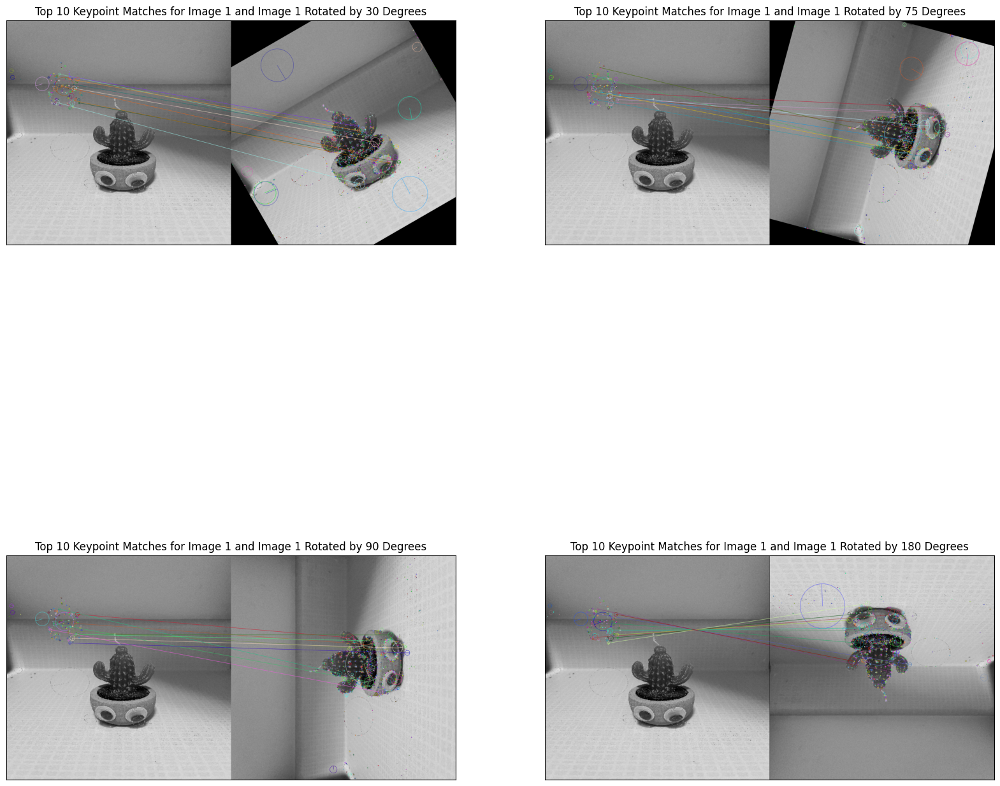

In [83]:
#Display the top ten matched keypoints for each pair of image_1 and a transformed image
image_1_30 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_30_degrees,keypoints_30,matches_30[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_75 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_75_degrees,keypoints_75,matches_75[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_90 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_90_degrees,keypoints_90,matches_90[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
image_1_180 = cv2.drawMatches(image_1,keypoints_l,image_1_rotated_180_degrees,keypoints_180,matches_180[:10],None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

#Display images
plt.figure(figsize=(20, 20))
plt.subplot(221), plt.imshow(image_1_30)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 30 Degrees'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(image_1_75)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 75 Degrees'), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(image_1_90)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 90 Degrees'), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(image_1_180)
plt.title('Top 10 Keypoint Matches for Image 1 and Image 1 Rotated by 180 Degrees'), plt.xticks([]), plt.yticks([])
plt.show()

### 6. Plot the matching distance for the top 100 matched keypoints. Plot the indices of the keypoints on the x-axis and the corresponding matching distance on the y-axis.


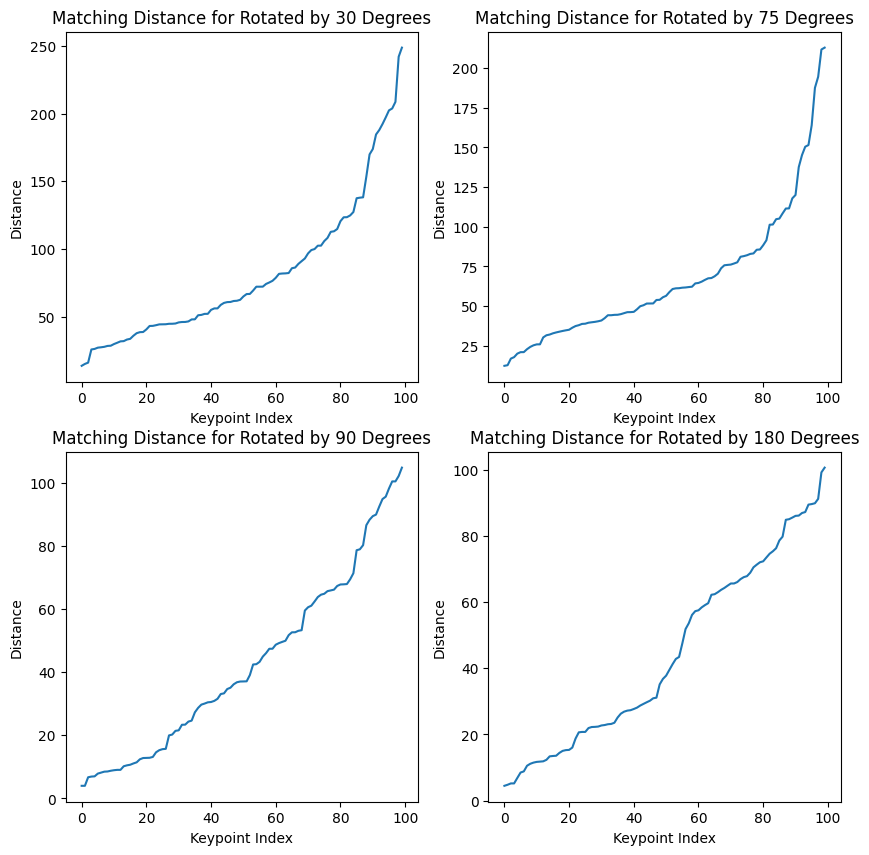

In [84]:
# a list of tuples containing the rotation degrees and the corresponding matches
rotations_and_matches = [
  (30, [match.distance for match in matches_30[:100]]),
  (75, [match.distance for match in matches_75[:100]]),
  (90, [match.distance for match in matches_90[:100]]),
  (180, [match.distance for match in matches_180[:100]])
]

plt.figure(figsize=(10, 10))

# iterate over the list to create the subplots
for i, (rotation, distances) in enumerate(rotations_and_matches, start=1):
  plt.subplot(220 + i)
  plt.plot(range(100), distances)
  plt.title(f'Matching Distance for Rotated by {rotation} Degrees')
  plt.xlabel('Keypoint Index')
  plt.ylabel('Distance')

plt.show()

### 7. Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Explain.

From the four plots above we notice a very minor change in matched disctance as the angle of rotation increases. This can be explained by the fact that the SIFT algorithm is not impacted by rotation since it uses the gradient of the image to find keypoints and their descriptors. The gradient is not affected by rotation, so the matching distance remains constant. Hence even with larger rotations, many keypoints can still be correctly matched, although the matching distance may be larger.



# 3 Image Stitching

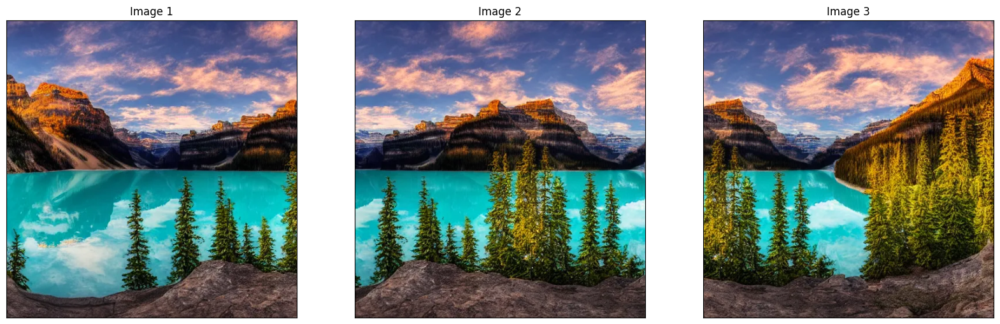

In [114]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
from cv2 import NORM_L2

path = '/Users/theog/Documents/CodingProjects/ECSE415_Computer_Vision/Assignments/A2/A2-W24-images/Data/'

#Load the 2 images
image_1 = cv2.imread(path+'Q3/part1.png')
image_2 = cv2.imread(path+'Q3/part2.png')
image_3 = cv2.imread(path+'Q3/part3.png')

image_1 = cv2.cvtColor(image_1,cv2.COLOR_BGR2RGB)
image_2 = cv2.cvtColor(image_2,cv2.COLOR_BGR2RGB)
image_3 = cv2.cvtColor(image_3,cv2.COLOR_BGR2RGB)

# display images
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(image_1)
plt.title('Image 1'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(image_2)
plt.title('Image 2'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(image_3)
plt.title('Image 3'), plt.xticks([]), plt.yticks([])
plt.show()



Helper method to crop out the black region out of images

In [ ]:
def crop_black_portion(image):
  # Convert the image to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Threshold the image to create a binary image
  _, binary = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

  # Find the first non-black pixel from left to right
  for i in range(binary.shape[1]):
    if np.any(binary[:, i] != 0):
      break

  # Crop the image from the first non-black pixel
  cropped_image = image[:, i:]

  return cropped_image

### (a) Compute the SIFT keypoints and corresponding descriptors for images 1 and 2.


In [115]:
# compute SIFT keypoints for both images
sift = cv2.SIFT_create()
keypoint_1, descriptor_1 = sift.detectAndCompute(image_1,None)
keypoint_2, descriptor_2 = sift.detectAndCompute(image_2,None)

### (b) Find matching keypoints in images 1 and 2 and display the 20 best pairs.

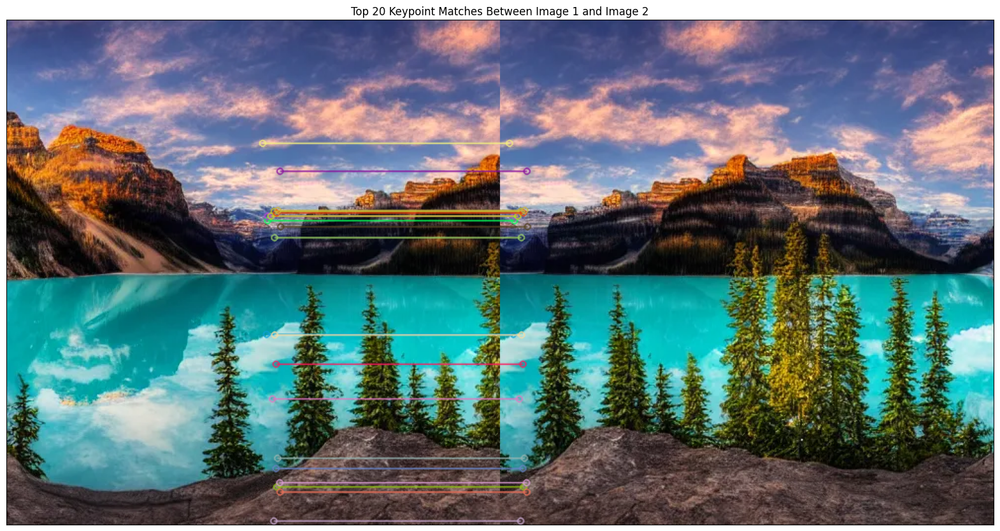

In [116]:
# match all keypoints between both images using a brute force matcher
bf = cv2.BFMatcher.create(normType = NORM_L2, crossCheck = True)
matches_image_12 = bf.match(descriptor_1,descriptor_2)

# sort matches by distance
matches_image_12 = sorted(matches_image_12, key = lambda x:x.distance)

# display best 20 matches
image_1_and_image_2 = cv2.drawMatches(image_1,keypoint_1,image_2,keypoint_2,matches_image_12[:20],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 20))
plt.imshow(image_1_and_image_2)
plt.title('Top 20 Keypoint Matches Between Image 1 and Image 2'), plt.xticks([]), plt.yticks([])
plt.show()

### (c) Find the homography that best matches the keypoints from image 1 and 2 using the RANSAC method, and apply the resulting transformation to image 1. Image 2 should not be transformed.

In [117]:
#Find the homography that best matches the keypoints from image 1 and 2 using the RANSAC method, and apply the resulting transformation to image 1. Image 2 should not be transformed.

# get the keypoints from the matches (from tutorial 4)
dst_pts = np.float32([ keypoint_1[m.queryIdx].pt for m in matches_image_12 ]).reshape(-1,1,2)
src_pts = np.float32([ keypoint_2[m.trainIdx].pt for m in matches_image_12 ]).reshape(-1,1,2)

# find the homography (from tutorial 4)
homography_12, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,4.0)

# warp image 1 to image 2 using the homography matrix
image_12 = cv2.warpPerspective(image_1, homography_12, (image_1.shape[1] + image_2.shape[1], image_1.shape[0]))


### (d) Stitch the transformed image 1 and the original image 2 together using linear image blending. Let us call this image 12. Display this image.

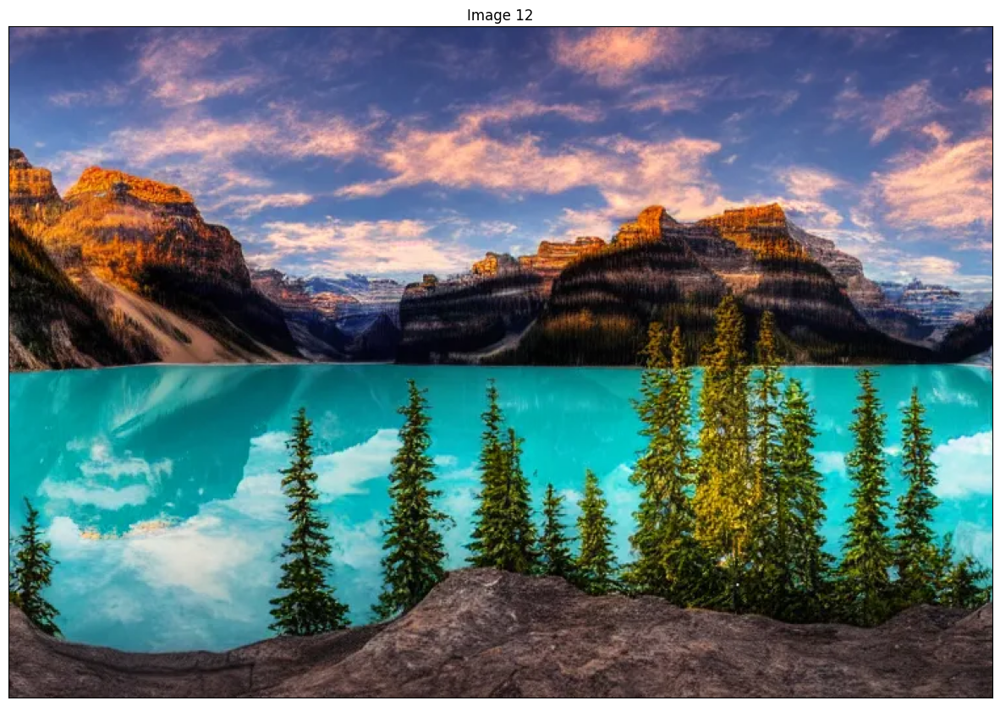

In [130]:
# merge image 2 to image 12 with linear blending
image_12[0:image_2.shape[0], image_2.shape[1]:image_2.shape[1]*2] = image_2

# display image 12
plt.figure(figsize=(15, 15))
plt.imshow(crop_black_portion(image_12))
plt.title('Image 12'), plt.xticks([]), plt.yticks([])
plt.show()

### (e) Compute the SIFT keypoints and corresponding descriptors for images 12 and 3.

In [119]:
# compute SIFT keypoints for image 12
keypoints_image_12, descriptor_image_12 = sift.detectAndCompute(image_12,None)
keypoints_image_3, descriptor_image_3 = sift.detectAndCompute(image_3,None)

### (f) Find the matching keypoints in 12 and 3 images and display the 20 best pairs.

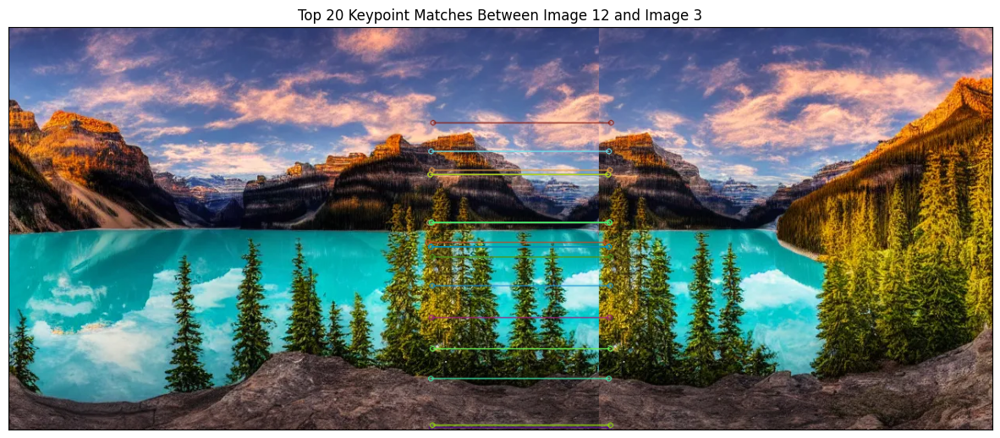

In [131]:
# match all keypoints between image 12 and image 3 using a brute force matcher
matches_image_123 = bf.match(descriptor_image_12,descriptor_image_3)

# sort matches by distance
matches_image_123 = sorted(matches_image_123, key = lambda x:x.distance)

# display best 20 matches
image_12_image_3 = cv2.drawMatches(image_12,keypoints_image_12,image_3,keypoints_image_3,matches_image_123[:20],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(15, 15))
plt.imshow(crop_black_portion(image_12_image_3))
plt.title('Top 20 Keypoint Matches Between Image 12 and Image 3'), plt.xticks([]), plt.yticks([])
plt.show()


### (g) Compute the homography using the RANSAC method. Apply the transformation to image 3. Image 12 should not be transformed.


In [121]:

# compute homography matrix using RANSAC with the first 20 matches
dst_pts_123 = np.float32([ keypoints_image_12[m.queryIdx].pt for m in matches_image_123 ]).reshape(-1,1,2)
src_pts_123 = np.float32([ keypoints_image_3[m.trainIdx].pt for m in matches_image_123 ]).reshape(-1,1,2)

homography_matrix_123, _ = cv2.findHomography(src_pts_123, dst_pts_123, cv2.RANSAC, 5.0)

# warp image 12 to image 3 using the homography matrix
image_123 = cv2.warpPerspective(image_12, homography_matrix_123, (image_12.shape[1] + image_3.shape[1] * 2, image_12.shape[0]))


### (h) Stitch the transformed image 3 and image 12 together using linear image blending. Display the resulting image.


In [1]:
image_123[:, :image_12.shape[1], :] = image_12

# display final panoramic image
plt.figure(figsize=(15, 15))
plt.imshow(crop_black_portion(image_123))
plt.title('Image 123'), plt.xticks([]), plt.yticks([])
plt.show()

NameError: name 'image_12' is not defined

### (i) Discuss: Note that we could also use multi-band blending in the section 

 Multi-band blending is a technique used to blend two images together. It uses Gaussian pyramids to blend the images, which allows for a more seamless transition between the images. The Gaussian pyramids are created by applying a Gaussian filter to the images and then downsampling the images. The blending is done by combining the images at different levels of the Gaussian pyramid, which allows for a smooth transition between the images. It is more used when the images have a significant difference in brightness or contrast.t


### (h) When should one prefer pyramid blending over linear blending? 

One would prefer using pyramid blending over linear blending when they are looking for a sharper and better blend as the pyramid blending uses more intricate and precise blending whereas linear blending is a more simple and straightforward method.